<h1 style=" text-align:center; color:Blue; font-size:40px;"> <u><b>Heart Attack Prediction With 91.8% Accuracy</b></u> </h1>

<p style="text-align:center; ">
<img src="https://www.cardio.com/hs-fs/hubfs/human%20heart%20illustration.jpeg?width=900&name=human%20heart%20illustration.jpeg" style='width: 400px;'>
</p>



# **<p style="color:Blue;">About The Dataset :</p>**
    
age: Age of the patient

sex: Sex of the patient

cp: Chest pain type, 0 = Typical Angina, 1 = Atypical Angina, 2 = Non-anginal Pain, 3 = Asymptomatic

trtbps: Resting blood pressure (in mm Hg)

chol: Cholestoral in mg/dl fetched via BMI sensor

fbs: (fasting blood sugar > 120 mg/dl), 1 = True, 0 = False

restecg: Resting electrocardiographic results, 0 = Normal, 1 = ST-T wave normality, 2 = Left ventricular hypertrophy

thalachh: Maximum heart rate achieved

oldpeak: Previous peak

slp: Slope

caa: Number of major vessels

thall: Thalium Stress Test result ~ (0,3)

exng: Exercise induced angina ~ 1 = Yes, 0 = No

output: Target variable



In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load
import seaborn as sns
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import lime
from lime import lime_tabular
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler 
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
import xgboost as xgb
from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsClassifier  
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import BernoulliNB
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix
from sklearn import svm, datasets
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_breast_cancer
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)



import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


***Reading The Dataset***

In [3]:
heart=pd.read_csv('heart.csv')
heart.head()

,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall,output
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


In [4]:
print('Number of rows are',heart.shape[0], 'and number of columns are ',heart.shape[1])

Number of rows are 303 and number of columns are  14


***Checking the shape of DataFrame***

***Checking for null values***

In [5]:
heart.isnull().sum()/len(heart)*100

age         0.0
sex         0.0
cp          0.0
trtbps      0.0
chol        0.0
fbs         0.0
restecg     0.0
thalachh    0.0
exng        0.0
oldpeak     0.0
slp         0.0
caa         0.0
thall       0.0
output      0.0
dtype: float64

**No null values found**

***Checking For datatypes of the attributes***

In [6]:
heart.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       303 non-null    int64  
 1   sex       303 non-null    int64  
 2   cp        303 non-null    int64  
 3   trtbps    303 non-null    int64  
 4   chol      303 non-null    int64  
 5   fbs       303 non-null    int64  
 6   restecg   303 non-null    int64  
 7   thalachh  303 non-null    int64  
 8   exng      303 non-null    int64  
 9   oldpeak   303 non-null    float64
 10  slp       303 non-null    int64  
 11  caa       303 non-null    int64  
 12  thall     303 non-null    int64  
 13  output    303 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 33.3 KB


**All attributes are of type 'int' except 'oldpeak'**

***Checking for duplicate rows***

In [7]:
heart[heart.duplicated()]


,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall,output
164,38,1,2,138,175,0,1,173,0,0.0,2,4,2,1


***Removing the duplicates***

In [8]:
heart.drop_duplicates(keep='first',inplace=True)


**Checking new shape**

In [9]:
print('Number of rows are',heart.shape[0], 'and number of columns are ',heart.shape[1])

Number of rows are 302 and number of columns are  14


***Checking statistical data***

In [10]:
heart.describe()

,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall,output
count,302.00000,302.000000,302.000000,302.000000,302.000000,302.000000,302.000000,302.000000,302.000000,302.000000,302.000000,302.000000,302.000000,302.000000
mean,54.42053,0.682119,0.963576,131.602649,246.500000,0.149007,0.526490,149.569536,0.327815,1.043046,1.397351,0.718543,2.314570,0.543046
std,9.04797,0.466426,1.032044,17.563394,51.753489,0.356686,0.526027,22.903527,0.470196,1.161452,0.616274,1.006748,0.613026,0.498970
min,29.00000,0.000000,0.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,48.00000,0.000000,0.000000,120.000000,211.000000,0.000000,0.000000,133.250000,0.000000,0.000000,1.000000,0.000000,2.000000,0.000000
50%,55.50000,1.000000,1.000000,130.000000,240.500000,0.000000,1.000000,152.500000,0.000000,0.800000,1.000000,0.000000,2.000000,1.000000
75%,61.00000,1.000000,2.000000,140.000000,274.750000,0.000000,1.000000,166.000000,1.000000,1.600000,2.000000,1.000000,3.000000,1.000000
max,77.00000,1.000000,3.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,4.000000,3.000000,1.000000


***Computing the correlation matrix***

In [11]:
heart.corr()

,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall,output
age,1.000000,-0.094962,-0.063107,0.283121,0.207216,0.119492,-0.111590,-0.395235,0.093216,0.206040,-0.164124,0.302261,0.065317,-0.221476
sex,-0.094962,1.000000,-0.051740,-0.057647,-0.195571,0.046022,-0.060351,-0.046439,0.143460,0.098322,-0.032990,0.113060,0.211452,-0.283609
cp,-0.063107,-0.051740,1.000000,0.046486,-0.072682,0.096018,0.041561,0.293367,-0.392937,-0.146692,0.116854,-0.195356,-0.160370,0.432080
trtbps,0.283121,-0.057647,0.046486,1.000000,0.125256,0.178125,-0.115367,-0.048023,0.068526,0.194600,-0.122873,0.099248,0.062870,-0.146269
chol,0.207216,-0.195571,-0.072682,0.125256,1.000000,0.011428,-0.147602,-0.005308,0.064099,0.050086,0.000417,0.086878,0.096810,-0.081437
fbs,0.119492,0.046022,0.096018,0.178125,0.011428,1.000000,-0.083081,-0.007169,0.024729,0.004514,-0.058654,0.144935,-0.032752,-0.026826
restecg,-0.111590,-0.060351,0.041561,-0.115367,-0.147602,-0.083081,1.000000,0.041210,-0.068807,-0.056251,0.090402,-0.083112,-0.010473,0.134874
thalachh,-0.395235,-0.046439,0.293367,-0.048023,-0.005308,-0.007169,0.041210,1.000000,-0.377411,-0.342201,0.384754,-0.228311,-0.094910,0.419955
exng,0.093216,0.143460,-0.392937,0.068526,0.064099,0.024729,-0.068807,-0.377411,1.000000,0.286766,-0.256106,0.125377,0.205826,-0.435601
oldpeak,0.206040,0.098322,-0.146692,0.194600,0.050086,0.004514,-0.056251,-0.342201,0.286766,1.000000,-0.576314,0.236560,0.209090,-0.429146


# ***Data Visualization***

***Breakdown of gender***

Number of people having sex as 1 are 96 and Number of people having sex as 0 are 206


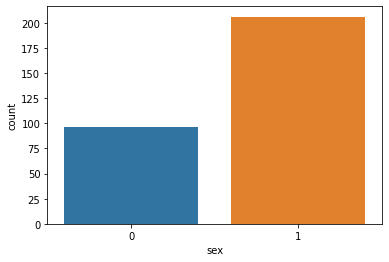

In [12]:
x=(heart.sex.value_counts())
print(f'Number of people having sex as 1 are {x[0]} and Number of people having sex as 0 are {x[1]}')
p = sns.countplot(data=heart, x="sex")
plt.show()

**People having gender as 0 are more than twice the people having gender as 1**

***Breakdown for chest pain***

0    143
2     86
1     50
3     23
Name: cp, dtype: int64


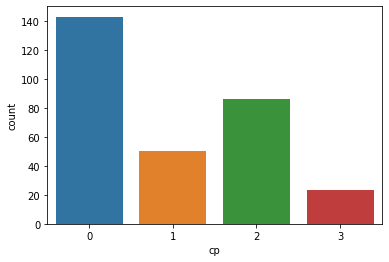

In [13]:
x=(heart.cp.value_counts())
print(x)
p = sns.countplot(data=heart, x="cp")
plt.show()

0    143
2     86
1     50
3     23
Name: cp, dtype: int64


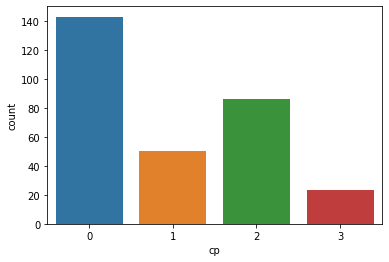

In [14]:
x=(heart.cp.value_counts())
print(x)
p = sns.countplot(data=heart, x="cp")
plt.show()

1. It can be observed people have chest pain of type 0 i.e 'Typical Angina' is the highest.
2. It can be observed people have chest pain of type 3 i.e 'Asymptomatic' is the lowest
3. It can also be observed people with chest pain of type 0 is almost 50% of all the people.

***Breakdown of FBS***

0    257
1     45
Name: fbs, dtype: int64


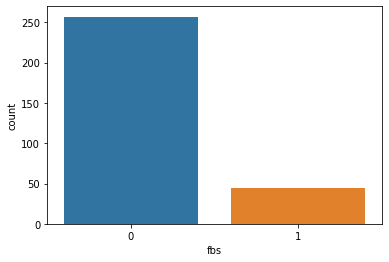

In [15]:
x=(heart.fbs.value_counts())
print(x)
p = sns.countplot(data=heart, x="fbs")
plt.show()



> FBS with value 0 is significantly higher than value 1.

***Breakdown of ECG***

1    151
0    147
2      4
Name: restecg, dtype: int64


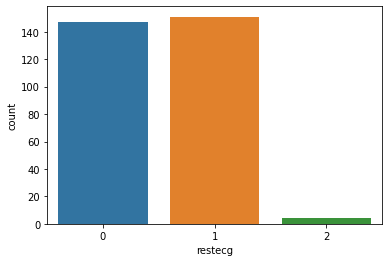

In [16]:
x=(heart.restecg.value_counts())
print(x)
p = sns.countplot(data=heart, x="restecg")
plt.show()



ECG count is almost the same for type 0 and 1. Also, for type 2 its almost negligible in comparision to type 0 and 1.

***Breakdown for Exercise Induced Angina***

0    203
1     99
Name: exng, dtype: int64


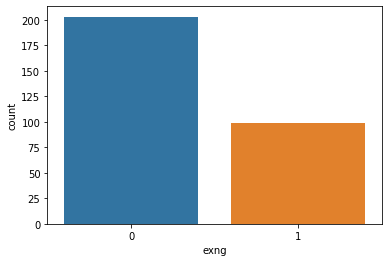

In [17]:
x=(heart.exng.value_counts())
print(x)
p = sns.countplot(data=heart, x="exng")
plt.show()


***EXNG count is more than double for type 0***

***Breakdown for Thalium Stress Test***

2    165
3    117
1     18
0      2
Name: thall, dtype: int64


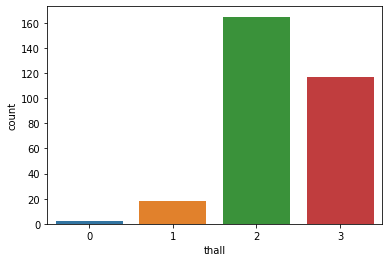

In [18]:
x=(heart.thall.value_counts())
print(x)
p = sns.countplot(data=heart, x="thall")
plt.show()


***Thall count is max for type 2 and min for type 0.***

***Density distribution for Age***

<Figure size 720x720 with 0 Axes>

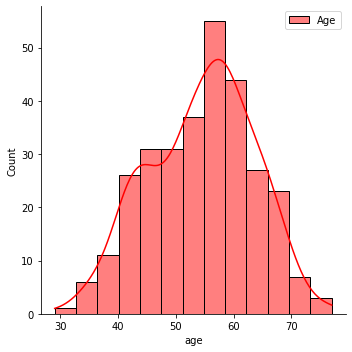

In [19]:
plt.figure(figsize=(10,10))
sns.displot(heart.age, color="red", label="Age", kde= True)
plt.legend()

**Density distribution is highest for age group 55 to 60**


<Figure size 1440x1440 with 0 Axes>

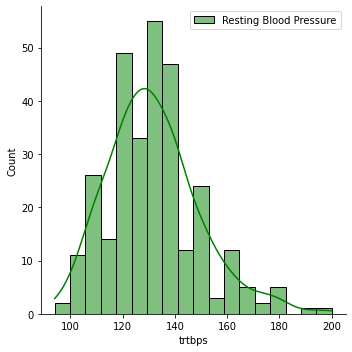

In [20]:
plt.figure(figsize=(20,20))
sns.displot(heart.trtbps , color="green", label="Resting Blood Pressure", kde= True)
plt.legend()

***Trtbs has the highest count around 130***

***Heart Attack Vs Age***

c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


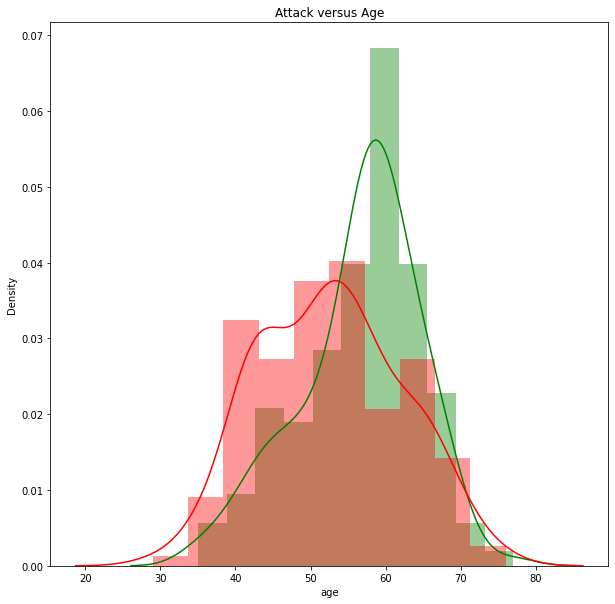

In [21]:
plt.figure(figsize=(10,10))
sns.distplot(heart[heart['output'] == 0]["age"], color='green',kde=True,) 
sns.distplot(heart[heart['output'] == 1]["age"], color='red',kde=True)
plt.title('Attack versus Age')
plt.show()



c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


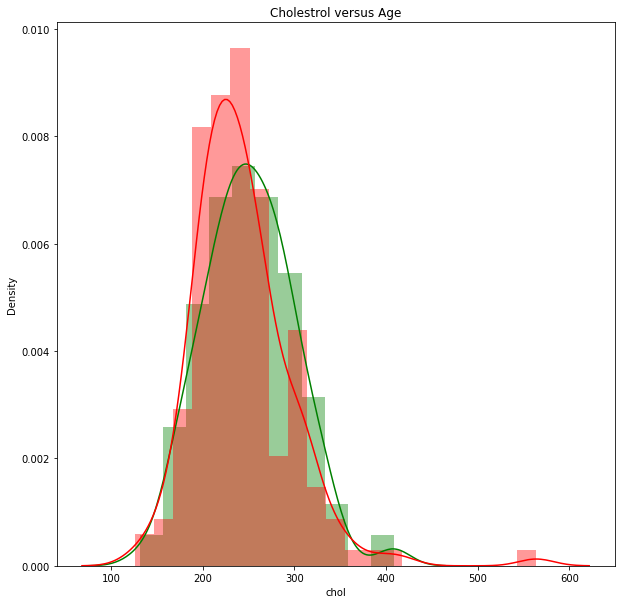

In [22]:
plt.figure(figsize=(10,10))
sns.distplot(heart[heart['output'] == 0]["chol"], color='green',kde=True,) 
sns.distplot(heart[heart['output'] == 1]["chol"], color='red',kde=True)
plt.title('Cholestrol versus Age')
plt.show()


c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


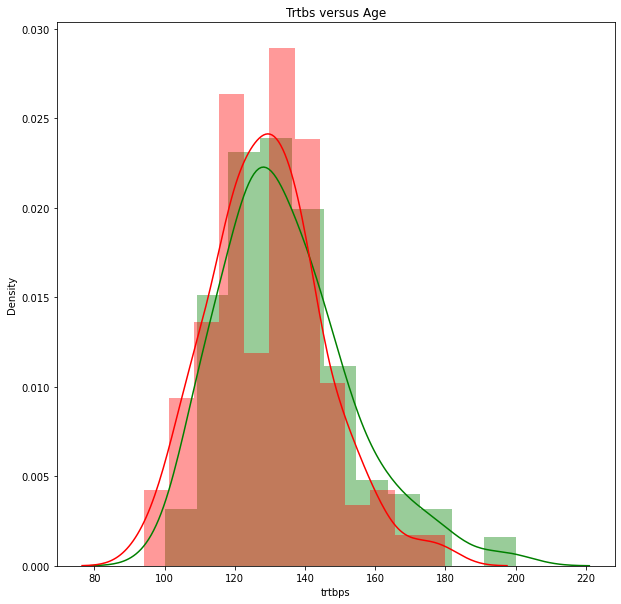

In [23]:
plt.figure(figsize=(10,10))
sns.distplot(heart[heart['output'] == 0]["trtbps"], color='green',kde=True,) 
sns.distplot(heart[heart['output'] == 1]["trtbps"], color='red',kde=True)
plt.title('Trtbs versus Age')
plt.show()

c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


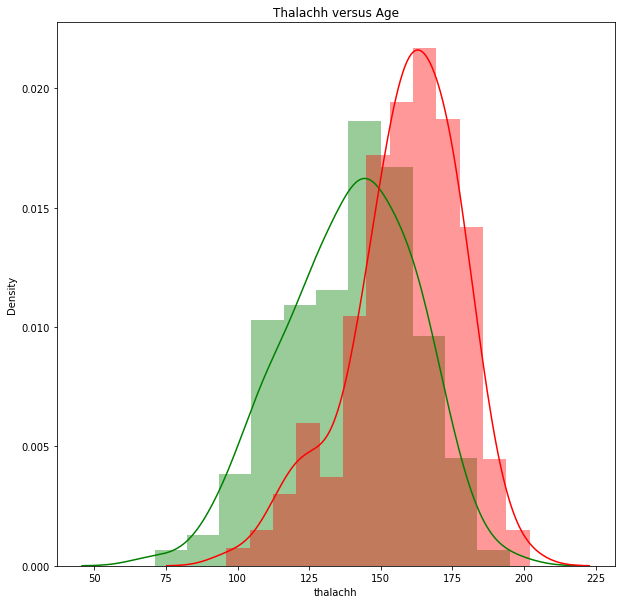

In [24]:
plt.figure(figsize=(10,10))
sns.distplot(heart[heart['output'] == 0]["thalachh"], color='green',kde=True,) 
sns.distplot(heart[heart['output'] == 1]["thalachh"], color='red',kde=True)
plt.title('Thalachh versus Age')
plt.show()


***Pair Plot***

<Figure size 1440x1440 with 0 Axes>

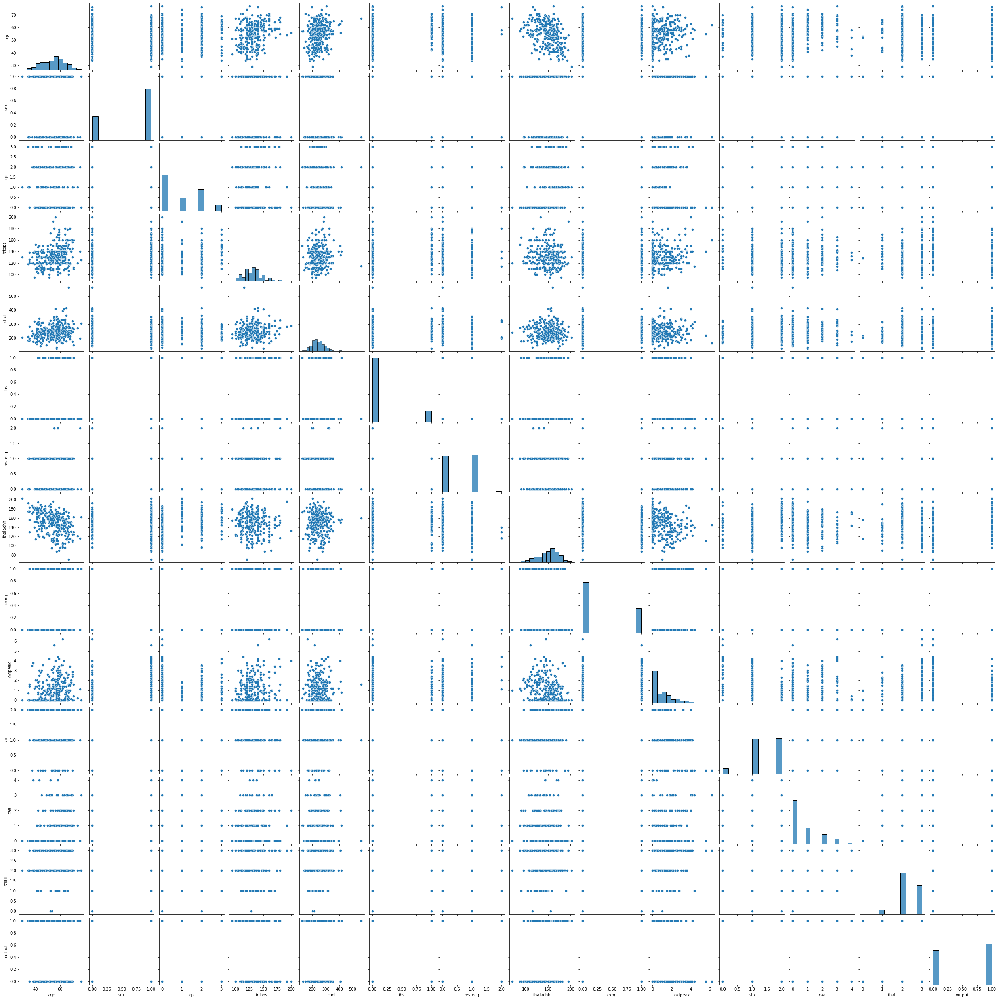

In [25]:
plt.figure(figsize=(20,20))
sns.pairplot(heart)
plt.show()

***Violin Plot***

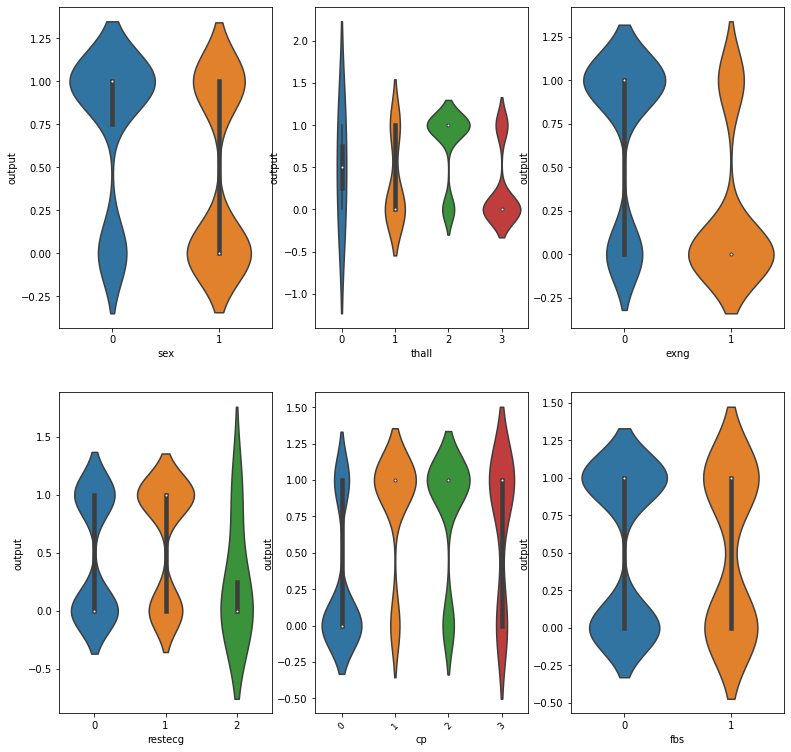

In [26]:
plt.figure(figsize=(13,13))
plt.subplot(2,3,1)
sns.violinplot(x = 'sex', y = 'output', data = heart)
plt.subplot(2,3,2)
sns.violinplot(x = 'thall', y = 'output', data = heart)
plt.subplot(2,3,3)
sns.violinplot(x = 'exng', y = 'output', data = heart)
plt.subplot(2,3,4)
sns.violinplot(x = 'restecg', y = 'output', data = heart)
plt.subplot(2,3,5)
sns.violinplot(x = 'cp', y = 'output', data = heart)
plt.xticks(fontsize=9, rotation=45)
plt.subplot(2,3,6)
sns.violinplot(x = 'fbs', y = 'output', data = heart)

plt.show()

# **Data preprocessing**

**There's no need for categorical encoding**

In [27]:
x = heart.iloc[:, 1:-1]
y = heart.iloc[:, -1]
x,y

(     sex  cp  trtbps  chol  fbs  restecg  thalachh  exng  oldpeak  slp  caa  \
 0      1   3     145   233    1        0       150     0      2.3    0    0   
 1      1   2     130   250    0        1       187     0      3.5    0    0   
 2      0   1     130   204    0        0       172     0      1.4    2    0   
 3      1   1     120   236    0        1       178     0      0.8    2    0   
 4      0   0     120   354    0        1       163     1      0.6    2    0   
 ..   ...  ..     ...   ...  ...      ...       ...   ...      ...  ...  ...   
 298    0   0     140   241    0        1       123     1      0.2    1    0   
 299    1   3     110   264    0        1       132     0      1.2    1    0   
 300    1   0     144   193    1        1       141     0      3.4    1    2   
 301    1   0     130   131    0        1       115     1      1.2    1    1   
 302    0   1     130   236    0        0       174     0      0.0    1    1   
 
      thall  
 0        1  
 1        

**Splitting the dataset into training and testing data**

In [31]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size= 0.2, random_state= 1502)


In [30]:
print('Shape for training data', x_train.shape, y_train.shape)
print('Shape for testing data', x_test.shape, y_test.shape)

Shape for training data (241, 12) (241,)
Shape for testing data (61, 12) (61,)


**Feature Scaling**

In [34]:
scaler = StandardScaler()
x_trainSCALED = scaler.fit_transform(x_train)
x_testSCALED = scaler.transform(x_test)

In [35]:
x_trainSCALED,x_testSCALED

(array([[-1.50225056, -0.90975328, -1.70647918, ..., -0.64666263,
         -0.72438258, -0.54488631],
        [ 0.66566791, -0.90975328,  0.58371423, ..., -0.64666263,
          2.16914561,  1.09658371],
        [ 0.66566791,  2.00065212, -1.2484405 , ..., -0.64666263,
         -0.72438258, -0.54488631],
        ...,
        [-1.50225056, -0.90975328,  0.12567555, ..., -0.64666263,
          1.20463622,  1.09658371],
        [-1.50225056, -0.90975328,  0.35469489, ...,  0.99381835,
         -0.72438258, -0.54488631],
        [ 0.66566791,  0.06038185, -0.10334379, ...,  0.99381835,
         -0.72438258, -0.54488631]]),
 array([[-1.50225056e+00,  6.03818546e-02, -7.90401813e-01,
         -6.87632236e-01, -4.39396526e-01,  8.60583944e-01,
          1.81564347e+00, -6.98322505e-01, -2.83977265e-01,
          9.93818351e-01, -7.24382575e-01, -5.44886314e-01],
        [ 6.65667915e-01, -9.09753277e-01, -6.75892143e-01,
         -3.28564154e-01, -4.39396526e-01, -1.02487724e+00,
         -9.

**1. Logistic Regression**

KFold Accuracy mean: 0.835 Standard Dev: (0.063)
Accuracy 0.8852459016393442


c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


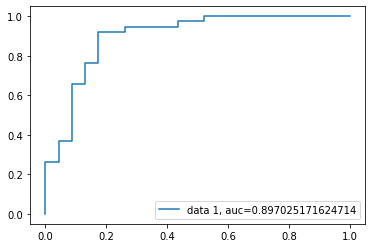

Confusion Matrix : 
 [[19  4]
 [ 4 34]]


The accuracy of Logistic Regression is :  86.88524590163934 %


In [36]:


x_scale = scaler.fit_transform(x)
#KFold code
cv = KFold(n_splits=5,random_state=1,shuffle=True)
model = LogisticRegression(max_iter=2000)
scores = cross_val_score(model,x,y,scoring='accuracy',cv=cv,n_jobs=1)
print('KFold Accuracy mean: %.3f Standard Dev: (%.3f)' % (np.mean(scores), np.std(scores)))

#ROC code
clf = LogisticRegression(penalty='l2', C=0.1)
clf.fit(x_train, y_train)
y_pred = clf.predict(x_test)
print("Accuracy", metrics.accuracy_score(y_test, y_pred))
y_pred_proba = clf.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

#Logistic Regression output
model.fit(x_train, y_train)
predicted=model.predict(x_test)
conf = confusion_matrix(y_test, predicted)
print ("Confusion Matrix : \n", conf)
print()
print()
print ("The accuracy of Logistic Regression is : ", accuracy_score(y_test, predicted)*100, "%")



In [37]:
#Lime output
explainer = lime_tabular.LimeTabularExplainer(training_data = np.array(x_train),
                                             feature_names = x_train.columns,
                                             mode = "regression")
exp = explainer.explain_instance(data_row = x_test.iloc[4],
                                predict_fn = model.predict)

exp.show_in_notebook(show_table = True)

c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\sklearn\base.py:441: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


In [38]:
exp.as_list()

[('caa <= 0.00', 0.3093511360379515),
 ('0.00 < sex <= 1.00', -0.2769021412027943),
 ('thall <= 2.00', 0.23496200200624412),
 ('thalachh > 168.00', 0.19434701321568684),
 ('1.00 < slp <= 2.00', 0.17305250799306018),
 ('exng <= 0.00', 0.1643553397105704),
 ('trtbps <= 120.00', 0.14326082282986025),
 ('0.00 < restecg <= 1.00', 0.12083157112962402),
 ('0.00 < oldpeak <= 0.80', 0.1079889296732452),
 ('0.00 < cp <= 1.00', 0.03156248506897495)]

**2.Gaussian Naive Bayes**

KFold Accuracy: 0.821 Standard Dev: (0.084)
Accuracy 0.819672131147541


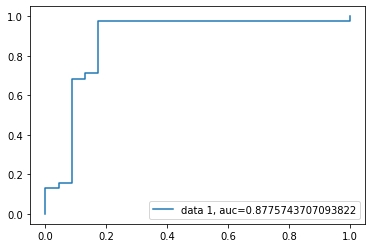

The accuracy of Gaussian Naive Bayes model is :  81.9672131147541 %
The accuracy of Gaussian Naive Bayes model against training set is :  84.23236514522821 %


c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\sklearn\base.py:441: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(


In [39]:
model = GaussianNB()
#KFold
cv = KFold(n_splits=10,random_state=1,shuffle=True)
scores = cross_val_score(model,x,y,scoring='accuracy',cv=cv,n_jobs=1)
print('KFold Accuracy: %.3f Standard Dev: (%.3f)' % (np.mean(scores), np.std(scores)))

#ROC
clf = GaussianNB()
clf.fit(x_train, y_train)
y_pred = clf.predict(x_test)
print("Accuracy", metrics.accuracy_score(y_test, y_pred))
y_pred_proba = clf.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

#Output for GNB
model.fit(x_train, y_train)
predicted = model.predict(x_test)
print("The accuracy of Gaussian Naive Bayes model is : ", accuracy_score(y_test, predicted)*100, "%")
predicted = model.predict(x_train)
print("The accuracy of Gaussian Naive Bayes model against training set is : ", accuracy_score(y_train, predicted)*100, "%")

#Lime
explainer = lime_tabular.LimeTabularExplainer(training_data = np.array(x_train),
                                             feature_names = x_train.columns,
                                             categorical_features = [0],
                                             mode = "regression")
exp = explainer.explain_instance(data_row = x_test.iloc[4],
                                predict_fn = model.predict)

exp.show_in_notebook(show_table = True)


In [40]:
exp.as_list()

[('exng <= 0.00', 0.3494466080863777),
 ('caa <= 0.00', 0.2508983969776924),
 ('1.00 < slp <= 2.00', 0.22044357527833314),
 ('sex=1', -0.2069410772088372),
 ('thalachh > 168.00', 0.17788283114791206),
 ('thall <= 2.00', 0.17171693187438755),
 ('0.00 < oldpeak <= 0.80', 0.1586111808924499),
 ('0.00 < restecg <= 1.00', 0.07084240123529158),
 ('trtbps <= 120.00', 0.05713121754831572),
 ('fbs <= 0.00', 0.05537086591110197)]

**3.Bernoulli Naive Bayes**

KFold Accuracy: 0.815 Standard Dev: (0.086)
Accuracy 0.8360655737704918


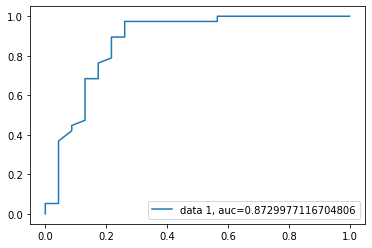

The accuracy of Gaussian Naive Bayes model is :  83.60655737704919 %
The accuracy of Gaussian Naive Bayes model against training set is :  82.15767634854771 %


In [41]:
model = BernoulliNB()
#KFold
cv = KFold(n_splits=10,random_state=1,shuffle=True)
scores = cross_val_score(model,x,y,scoring='accuracy',cv=cv,n_jobs=1)
print('KFold Accuracy: %.3f Standard Dev: (%.3f)' % (np.mean(scores), np.std(scores)))

#ROC
clf = BernoulliNB()
clf.fit(x_train, y_train)
y_pred = clf.predict(x_test)
print("Accuracy", metrics.accuracy_score(y_test, y_pred))
y_pred_proba = clf.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

#BNB output
model.fit(x_train, y_train)
predicted = model.predict(x_test)
print("The accuracy of Gaussian Naive Bayes model is : ", accuracy_score(y_test, predicted)*100, "%")
predicted = model.predict(x_train) 
print("The accuracy of Gaussian Naive Bayes model against training set is : ", accuracy_score(y_train, predicted)*100, "%")



In [42]:
#Lime
explainer = lime_tabular.LimeTabularExplainer(training_data = np.array(x_train),
                                             feature_names = x_train.columns,
                                             class_names = ['0','1'],
                                             mode = "regression")
exp = explainer.explain_instance(data_row = x_test.iloc[4],
                                predict_fn = model.predict)

exp.show_in_notebook(show_table = True)

c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\sklearn\base.py:441: UserWarning: X does not have valid feature names, but BernoulliNB was fitted with feature names
  warnings.warn(


In [43]:
exp.as_list()

[('caa <= 0.00', 0.4587434222582032),
 ('exng <= 0.00', 0.4313806798984527),
 ('0.00 < cp <= 1.00', 0.2449337995069554),
 ('0.00 < restecg <= 1.00', 0.2139523507147705),
 ('0.00 < sex <= 1.00', -0.20217263415167266),
 ('0.00 < oldpeak <= 0.80', -0.10304059490031003),
 ('fbs <= 0.00', 0.03232205813520028),
 ('chol > 274.00', 0.008181172191356754),
 ('thall <= 2.00', 0.007965050703344861),
 ('1.00 < slp <= 2.00', 0.007324805627289355)]

* True Positive + True Negative : 54
* False Positive + False Negative : 7

**4.Support Vector Machine**

KFold Accuracy: 0.666 Standard Dev: (0.064)
Accuracy 0.8852459016393442


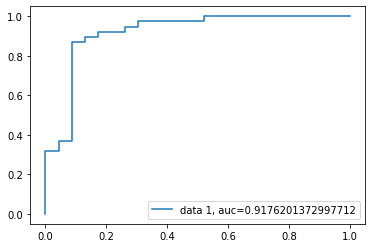

The accuracy of SVM is :  73.77049180327869 %
The accuracy of SVM against training set is :  65.14522821576763 %


In [44]:
#KFold
model = SVC()
cv = KFold(n_splits=5,random_state=1,shuffle=True)
scores = cross_val_score(model,x,y,scoring='accuracy',cv=cv,n_jobs=1)
print('KFold Accuracy: %.3f Standard Dev: (%.3f)' % (np.mean(scores), np.std(scores)))

#ROC
clf = SVC(kernel="linear", probability=True)
clf.fit(x_train, y_train)
y_pred = clf.predict(x_test)
print("Accuracy", metrics.accuracy_score(y_test, y_pred))
y_pred_proba = clf.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

#SVM output
model.fit(x_train, y_train)
predicted = model.predict(x_test)
print("The accuracy of SVM is : ", accuracy_score(y_test, predicted)*100, "%")
predicted = model.predict(x_train)
print("The accuracy of SVM against training set is : ", accuracy_score(y_train, predicted)*100, "%")



In [45]:
#Lime
explainer = lime_tabular.LimeTabularExplainer(training_data = np.array(x_train),
                                             feature_names = x_train.columns,
                                             mode = "regression")
exp = explainer.explain_instance(data_row = x_test.iloc[1],
                                predict_fn = model.predict)

exp.show_in_notebook(show_table = True)



c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\sklearn\base.py:441: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


In [46]:
exp.as_list()

[('thalachh <= 136.00', -0.9108821172256346),
 ('trtbps <= 120.00', 0.07642733652450172),
 ('211.00 < chol <= 243.00', 0.011947648966654323),
 ('0.00 < exng <= 1.00', -0.00904084945304937),
 ('cp <= 0.00', -0.007719337637530868),
 ('2.00 < thall <= 3.00', -0.007307628288097796),
 ('oldpeak > 1.60', 0.007045132906142021),
 ('restecg <= 0.00', -0.006407385113901529),
 ('0.00 < sex <= 1.00', 0.005132196132251456),
 ('caa > 1.00', -0.0033116111504264694)]

**5.Random Forest**

In [111]:
#KFold

model = RandomForestRegressor(n_estimators = 100, random_state = 1502)  
model.fit(x_train, y_train)
#cv = KFold(n_splits=10,random_state=0,shuffle=True)
#scores = cross_val_score(model,x,y,scoring='neg_mean_squared_error',cv=cv,n_jobs=1)
#print('KFold Accuracy: %.3f Standard Dev: (%.3f)' % (np.mean(scores), np.std(scores)))


#ROC


#Random Forest output
predicted = model.predict(x_test)
print("The accuracy of Random Forest is : ", accuracy_score(y_test, predicted.round())*100, "%")
predicted = model.predict(x_train)
print("The accuracy of Random Forest against training set is : ", accuracy_score(y_train, predicted.round())*100, "%")



The accuracy of Random Forest is :  80.32786885245902 %
The accuracy of Random Forest against training set is :  100.0 %


In [114]:
#Lime
from lime import lime_tabular
explainer = lime_tabular.LimeTabularExplainer(training_data = np.array(x_train),
                                              mode = "regression",
                                             feature_names = x_train.columns,
                                             categorical_features = [0])
exp = explainer.explain_instance(data_row = x_test.iloc[10],
                                predict_fn = model.predict)
exp.show_in_notebook(show_table = True)



c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\sklearn\base.py:441: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


In [115]:
exp.as_list()

[('0.00 < caa <= 1.00', -0.2205766999477591),
 ('thall <= 2.00', 0.17416300879116411),
 ('1.00 < cp <= 2.00', 0.1570097813198152),
 ('oldpeak <= 0.00', 0.11345232212729923),
 ('slp <= 1.00', -0.08773105972410807),
 ('trtbps > 140.00', -0.06181920245877248),
 ('sex=0', 0.054443207538362084),
 ('exng <= 0.00', 0.05121000846787533),
 ('136.00 < thalachh <= 155.00', -0.04637529230074446),
 ('chol > 274.00', -0.03225317453420143)]

**6.K Nearest Neighbours**

c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\sklearn\base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\sklearn\base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\sklearn\base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\sklearn\base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\sklearn\base.py:441: UserWarning: X does not have valid fe

KFold Accuracy: 0.596 Standard Dev: (0.088)
Accuracy 0.6065573770491803


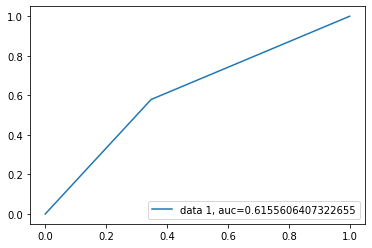

[[15  8]
 [16 22]]
The accuracy of KNN is :  60.65573770491803 %
Training set Confusion Matrix [[115   0]
 [  0 126]]
The accuracy of KNN against training set is :  100.0 %


c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\sklearn\base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


In [50]:
#KFold
model = KNeighborsClassifier(n_neighbors = 1)  
cv = KFold(n_splits=10,random_state=1,shuffle=True)
scores = cross_val_score(model,x,y,scoring='accuracy',cv=cv,n_jobs=1)
print('KFold Accuracy: %.3f Standard Dev: (%.3f)' % (np.mean(scores), np.std(scores)))
model.fit(x_train, y_train)
predicted = model.predict(x_test)
  

#ROC
clf = KNeighborsClassifier(n_neighbors = 1)
clf.fit(x_train, y_train)
y_pred = clf.predict(x_test)
print("Accuracy", metrics.accuracy_score(y_test, y_pred))
y_pred_proba = clf.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

#KNN ouput
print(confusion_matrix(y_test, predicted))
print("The accuracy of KNN is : ", accuracy_score(y_test, predicted.round())*100, "%")
predicted = model.predict(x_train)  
print("Training set Confusion Matrix",confusion_matrix(y_train, predicted))
print("The accuracy of KNN against training set is : ", accuracy_score(y_train, predicted.round())*100, "%")



In [51]:
#Lime
explainer = lime_tabular.LimeTabularExplainer(training_data = np.array(x_train),
                                             feature_names = x_train.columns,
                                             mode = "regression")
exp = explainer.explain_instance(data_row = x_test.iloc[22],
                                predict_fn = model.predict)

exp.show_in_notebook(show_table = True)

  


c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\sklearn\base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\sklearn\base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


In [52]:
exp.as_list()

[('155.00 < thalachh <= 168.00', 0.15567914074362657),
 ('trtbps > 140.00', -0.0975860395336924),
 ('chol > 274.00', -0.06108963962473494),
 ('sex <= 0.00', -0.029816129187764235),
 ('exng <= 0.00', 0.028194786201496097),
 ('0.00 < cp <= 1.00', 0.016423601352946418),
 ('caa > 1.00', 0.014916739410313943),
 ('1.00 < slp <= 2.00', -0.009080886738674456),
 ('0.00 < oldpeak <= 0.80', -0.006686556071430586),
 ('0.00 < restecg <= 1.00', 0.003957582215021286)]

**Optimizing the KNN**

c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\sklearn\base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\sklearn\base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\sklearn\base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\sklearn\base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\sklearn\base.py:441: UserWarning: X does not have valid fe

Text(0, 0.5, 'Error Rate')

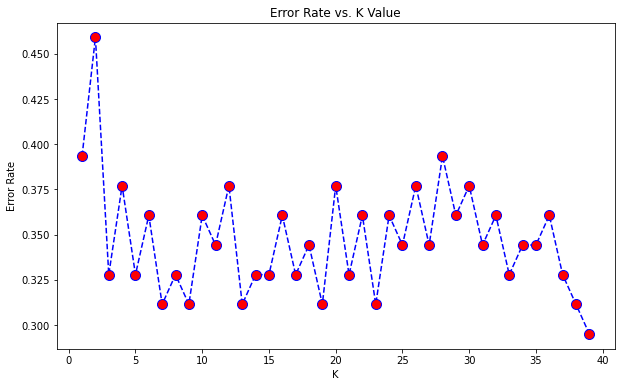

In [53]:
error_rate = []
  
for i in range(1, 40):
      
    model = KNeighborsClassifier(n_neighbors = i)
    model.fit(x_train, y_train)
    pred_i = model.predict(x_test)
    error_rate.append(np.mean(pred_i != y_test))
  
plt.figure(figsize =(10, 6))
plt.plot(range(1, 40), error_rate, color ='blue',
                linestyle ='dashed', marker ='o',
         markerfacecolor ='red', markersize = 10)
  
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')



With k=7 as it hovers after that

In [ ]:
#KFold
model = KNeighborsClassifier(n_neighbors = 7)
model.fit(x_train, y_train)
cv = KFold(n_splits=10,random_state=1,shuffle=True)
scores = cross_val_score(model,x,y,scoring='accuracy',cv=cv,n_jobs=1)
print('KFold Accuracy: %.3f Standard Dev: (%.3f)' % (np.mean(scores), np.std(scores)))

#ROC
clf = KNeighborsClassifier(n_neighbors = 7)
clf.fit(x_train, y_train)
y_pred = clf.predict(x_test)
print("Accuracy", metrics.accuracy_score(y_test, y_pred))
y_pred_proba = clf.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

#KNN Optmized output
predicted = model.predict(x_test) 
print('Confusion Matrix :')
from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(y_test, predicted))
print()
print()
print("The accuracy of KNN is : ", accuracy_score(y_test, predicted.round())*100, "%")

#Lime
explainer = lime_tabular.LimeTabularExplainer(training_data = np.array(x_train),
                                             feature_names = x_train.columns,
                                             mode = "regression")
exp = explainer.explain_instance(data_row = x_test.iloc[4],
                                predict_fn = model.predict)

exp.show_in_notebook(show_table = True)


**7.X Gradient Boosting**

In [ ]:
#KFold
model = xgb.XGBClassifier(use_label_encoder=False)
cv = KFold(n_splits=10,random_state=1,shuffle=True)
scores = cross_val_score(model,x,y,scoring='accuracy',cv=cv,n_jobs=1)
print('KFold Accuracy: %.3f Standard Dev: (%.3f)' % (np.mean(scores), np.std(scores)))

#ROC
clf = xgb.XGBClassifier(use_label_encoder=False)
clf.fit(x_train, y_train)
y_pred = clf.predict(x_test)
print("Accuracy", metrics.accuracy_score(y_test, y_pred))
y_pred_proba = clf.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

#XGB output
model.fit(x_train, y_train)
predicted = model.predict(x_test)   
cm = confusion_matrix(y_test, predicted)
print(cm)
print ("The accuracy of X Gradient Boosting is : ", accuracy_score(y_test, predicted)*100, "%")

#Lime
explainer = lime_tabular.LimeTabularExplainer(training_data = np.array(x_train),
                                             feature_names = x_train.columns,
                                             mode = "regression")
exp = explainer.explain_instance(data_row = x_test.iloc[4],
                                predict_fn = model.predict)

exp.show_in_notebook(show_table = True)


 # **Conclusion**

1. Most of the models are performing really well.
2. SVM is performing the best for the given dataset.

In [94]:
model = RandomForestRegressor(n_estimators = 200, random_state = 0)  
#Random Forest output
model.fit(x_train, y_train)  
predicted = model.predict(x_test)
print("The accuracy of Random Forest is : ", accuracy_score(y_test, predicted.round())*100, "%")
predicted = model.predict(x_train)
print("The accuracy of Random Forest against training set is : ", accuracy_score(y_train, predicted.round())*100, "%")

#Lime
from lime import lime_tabular
explainer = lime_tabular.LimeTabularExplainer(training_data = np.array(x_train),
                                              mode = "regression",
                                             feature_names = x_train,
                                             categorical_features = [0])
exp = explainer.explain_instance(data_row = x_test.iloc[4],
                                predict_fn = model.predict)
exp.show_in_notebook(show_table = True)

The accuracy of Random Forest is :  80.32786885245902 %
The accuracy of Random Forest against training set is :  100.0 %


c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\sklearn\base.py:441: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


In [100]:
heart = pd.read_csv('heart.csv')
heart.head()



,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall,output
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


In [105]:
from sklearn.model_selection import train_test_split

x = heart.drop("output",axis=1)
y = heart["output"]

x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=0)


In [106]:
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor(random_state=0,n_estimators=100)
model.fit(x_train,y_train)
score = model.score(x_test,y_test)

In [107]:
import lime
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(training_data = np.array(x_train),
                                             feature_names = x_train.columns,
                                             class_names = ['0','1'],
                                             mode = "regression")


In [108]:
exp = explainer.explain_instance(data_row = x_test.iloc[4],
                                predict_fn = model.predict)

exp.show_in_notebook(show_table = True)

c:\users\brendan\appdata\local\programs\python\python38\lib\site-packages\sklearn\base.py:441: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
